# SDXL LoRA Pipeline
Goal: create a pipeline to create and use LoRAs with SDXL

## Steps
- [x] run sdxl locally
- [x] use 3rd party LoRA
- [x] train a LoRA
- [x] use a trained LoRA
- [ ] create easy to use pipeline for generating LoRAs from image sets
- [ ] use LoRA for image to image generation

## Initialisation of SDXL

In [1]:
# test sdxl installation

# see: https://huggingface.co/docs/diffusers/en/using-diffusers/sdxl

from diffusers import StableDiffusionXLPipeline
import torch

text2img = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
).to("cuda")



c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00,  9.03it/s]


## Text2Image Generation Test

  0%|          | 0/24 [00:00<?, ?it/s]c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 24/24 [00:08<00:00,  2.69it/s]


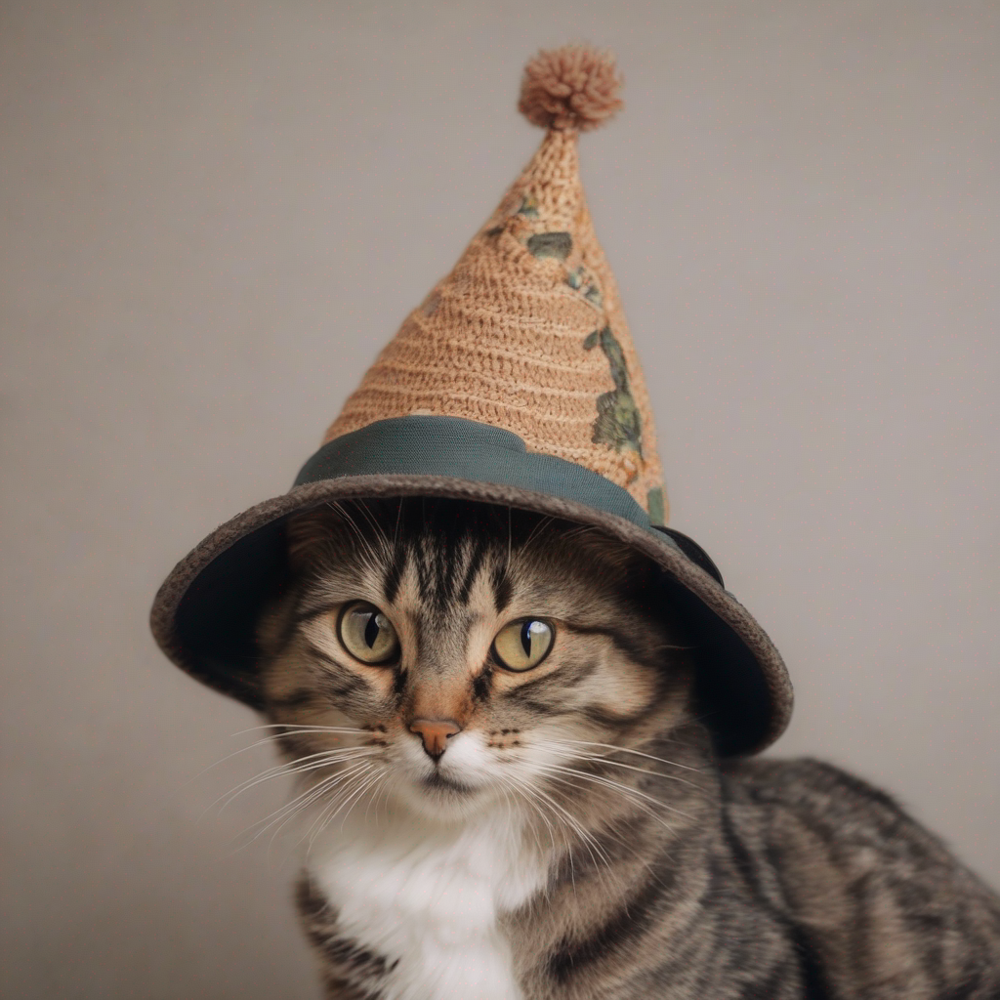

In [2]:
# text to image
text = "A photo of a cat with a hat"
output = text2img(text, num_inference_steps=24)
img = output.images[0]
display(img)

## Image2Image Generation Test

We will use the previously generated image as the input for the next step.
Here we will try to change the subject of a cat to a dog, while keeping the non-cat parts of the image the same.

In [3]:
# image to image
prompt = "dog"
# use image of cat as input

from diffusers import StableDiffusionXLImg2ImgPipeline

img2img = StableDiffusionXLImg2ImgPipeline(**text2img.components)



100%|██████████| 11/11 [00:03<00:00,  2.99it/s]


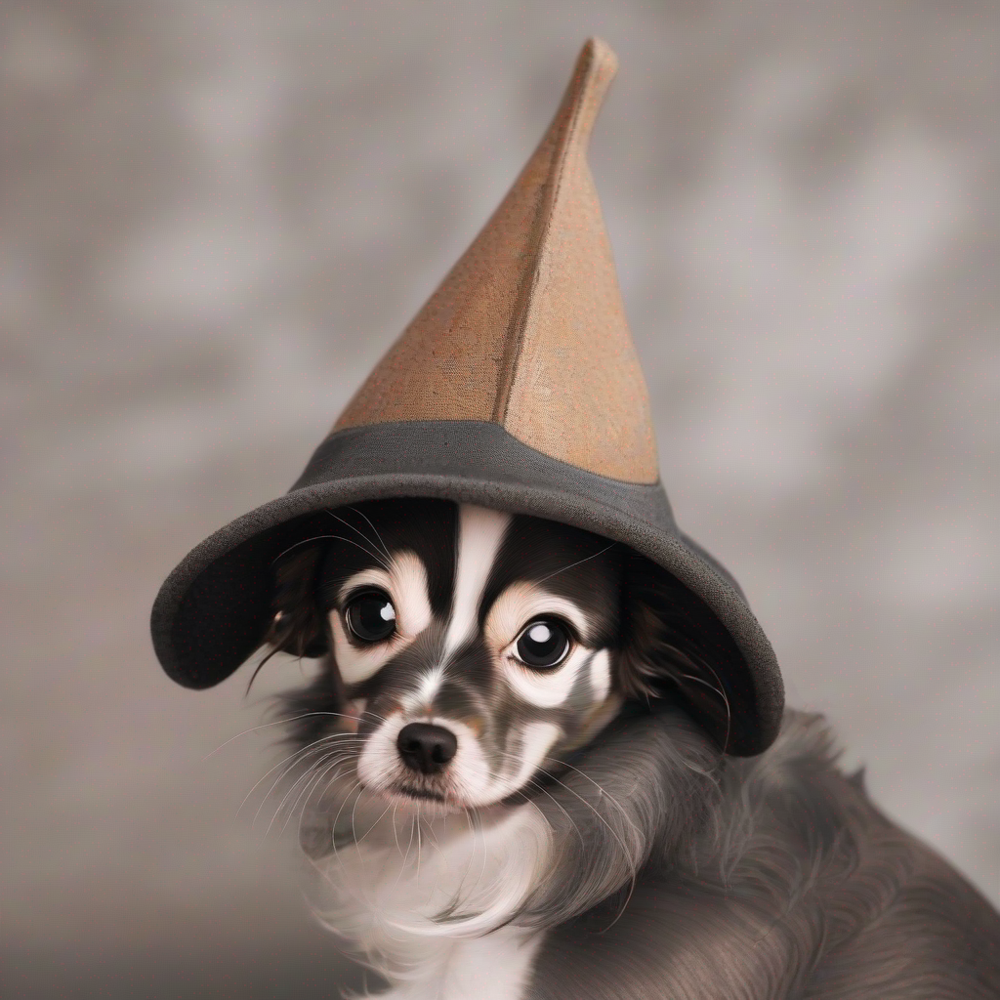

In [4]:
img2 = img2img(prompt, strength=0.7, guidance_scale=12, num_inference_steps=16, image=img).images[0]
display(img2)

## LoRA Test

In this step we will load a pre-trained LoRA and use it to generate an image from a text description.
To compare results, we will use the same settings, including the seed for the random number generator.
Since the LoRA changes the weights of the network (or at least the values of the latent space, depending on the implementation), the same seed as before will not produce the same result.

100%|██████████| 16/16 [00:04<00:00,  3.32it/s]


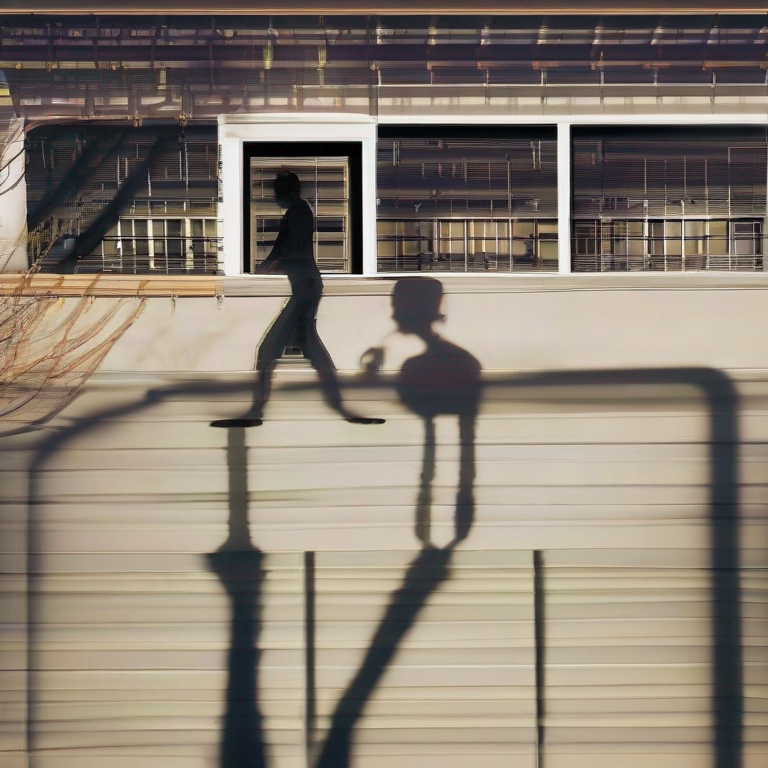

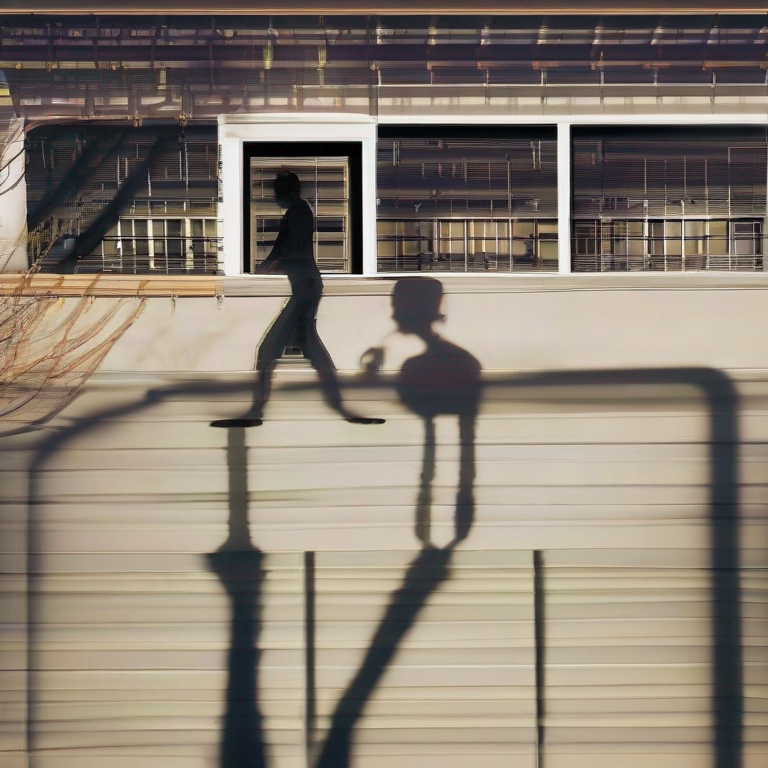

In [13]:
# test 3rd party lora
# see: https://huggingface.co/docs/diffusers/en/training/lora


# try this lora from civitai: https://civitai.com/models/131336/flowers-and-shadow-sdxl
# trigger word: "Flower shadow"
seed = 42
generator = torch.manual_seed(seed)
# first run before loading weights
# run twice to see if results are consistent
# smaller image size to speed up generation
no_lora_1 = text2img("Flower shadow", num_inference_steps=16, generator=generator, width=768, height=768).images[0]
generator = torch.manual_seed(seed)
no_lora_2 = text2img("Flower shadow", num_inference_steps=16, generator=generator, width=768, height=768).images[0]

display(no_lora_1)
display(no_lora_2)



The same seed resulted in the same generated image. In the next test we will load a LoRA and generate an image with the same seed. Since this
changes the model, we expect the generated image to be different if the LoRA was loaded correctly.

c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\diffusers\loaders\lora.py:805: FutureWarning: `_modify_text_encoder` is deprecated and will be removed in version 0.27. You are using an old version of LoRA backend. This will be deprecated in the next releases in favor of PEFT make sure to install the latest PEFT and transformers packages in the future.
  deprecate("_modify_text_encoder", "0.27", LORA_DEPRECATION_MESSAGE)
c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\diffusers\loaders\lora.py:777: FutureWarning: `_remove_text_encoder_monkey_patch_classmethod` is deprecated and will be removed in version 0.27. You are using an old version of LoRA backend. This will be deprecated in the next releases in favor of PEFT make sure to install the latest PEFT and transformers packages in the future.
  deprecate("_remove_text_encoder_monkey_patch_classmethod", "0.27", LORA_DEPRECATION_MESSAGE)
100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


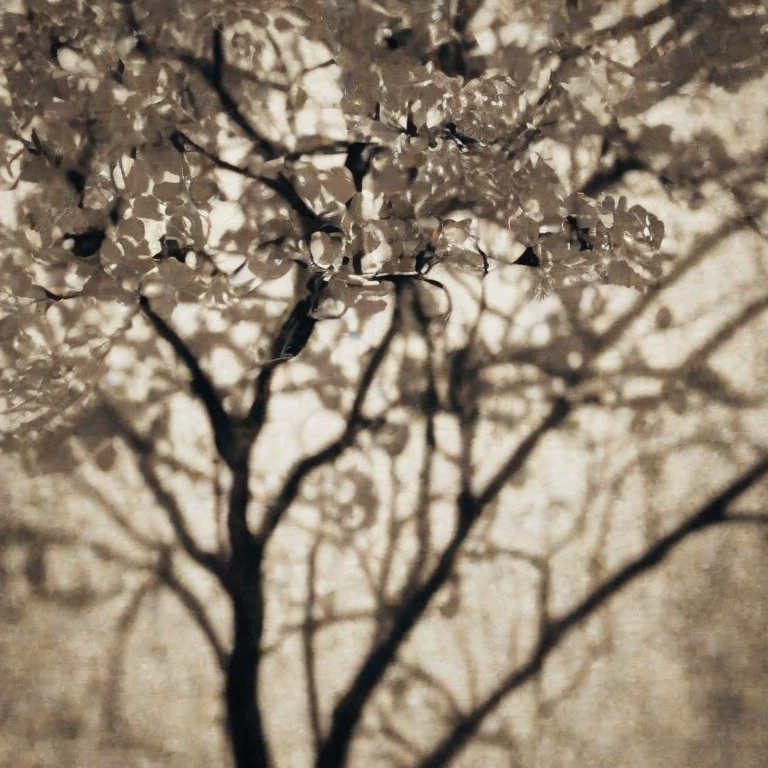

In [14]:
# download this if you don't have it
text2img.load_lora_weights("models/SDXL_flower_shadow_Sa_May_V3.safetensors")

generator = torch.manual_seed(seed)
lora_1 = text2img("Flower shadow", num_inference_steps=16, generator=generator, width=768, height=768).images[0]
display(lora_1)

## LoRA Training

In this step we will train a LoRA from scratch and then use it to generate an image from a text description. We will also save the trained LoRA to disk.

The training set will be a small sample of fruit images consisting of strawberries, bananas, watermelons, blueberries, and peaches.
The full dataset can be found [here](https://www.vicos.si/resources/fids30/).

https://github.com/huggingface/diffusers/blob/main/examples/text_to_image/README_sdxl.md

In [1]:

# demo as import, no accelerate?

import sys
sys.path.append('diffusers/examples/text_to_image')

from train_text_to_image_lora_sdxl import main as train_lora, parse_args

arg_str = '''--pretrained_model_name_or_path=stabilityai/stable-diffusion-xl-base-1.0
    --pretrained_vae_model_name_or_path=madebyollin/sdxl-vae-fp16-fix
    --train_data_dir=data/fruits/
    --caption_column=text
    --resolution=1024
    --train_batch_size=1
    --num_train_epochs=1
    --checkpointing_steps=64
    --learning_rate=2e-04
    --lr_scheduler=constant
    --lr_warmup_steps=0
    --mixed_precision=fp16
    --validation_epochs=20
    --seed=42
    --output_dir=loras/rank2
    --validation_prompt=foo bar
    --rank=2'''

arg_str = arg_str.split('\n')
arg_str = [arg.strip() for arg in arg_str]

args = parse_args(arg_str)
train_lora(args)


c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Ben\Documents\code\py\sdxl-lora-pipeline\source\diffusers\src\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
02/03/2024 20:22:26 - INFO - train_text_to_image_lora_sdxl - Distributed environment: DistributedType.NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all 

In [5]:
# start training script
!accelerate launch diffusers/examples/text_to_image/train_text_to_image_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --train_data_dir="data/fruits/" --caption_column="text" \
  --resolution=1024  \
  --train_batch_size=1 \
  --num_train_epochs=1 \
  --checkpointing_steps=64 \
  --learning_rate=2e-04 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --mixed_precision="fp16" \
  --validation_epochs=20 \
  --seed=42 \
  --output_dir="loras/rank2" \
  --validation_prompt="foo bar" \
  --rank=2

Namespace(pretrained_model_name_or_path='stabilityai/stable-diffusion-xl-base-1.0', pretrained_vae_model_name_or_path='madebyollin/sdxl-vae-fp16-fix', revision=None, variant=None, dataset_name=None, dataset_config_name=None, train_data_dir='data/fruits/', image_column='image', caption_column='text', validation_prompt='foo bar', num_validation_images=4, validation_epochs=20, max_train_samples=None, output_dir='loras/rank2', cache_dir=None, seed=42, resolution=1024, center_crop=False, random_flip=False, train_text_encoder=False, train_batch_size=1, num_train_epochs=1, max_train_steps=None, checkpointing_steps=64, checkpoints_total_limit=None, resume_from_checkpoint=None, gradient_accumulation_steps=1, gradient_checkpointing=False, learning_rate=0.0002, scale_lr=False, lr_scheduler='constant', lr_warmup_steps=0, snr_gamma=None, allow_tf32=False, dataloader_num_workers=0, use_8bit_adam=False, adam_beta1=0.9, adam_beta2=0.999, adam_weight_decay=0.01, adam_epsilon=1e-08, max_grad_norm=1.0, p

C:\Users\Ben\Documents\code\py\sdxl-lora-pipeline\source\diffusers\src\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [6]:


# start training script
!accelerate launch libraries/diffusers/examples/text_to_image/train_text_to_image_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --train_data_dir="data/fruits/" --caption_column="text" \
  --resolution=1024  \
  --train_batch_size=1 \
  --num_train_epochs=4 \
  --checkpointing_steps=64 \
  --learning_rate=2e-04 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --mixed_precision="fp16" \
  --validation_epochs=20 \
  --seed=42 \
  --output_dir="loras" \
  --validation_prompt="foo bar" 

C:\Users\Ben\Documents\code\py\sdxl-lora-pipeline\source\diffusers\src\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
02/03/2024 15:56:16 - INFO - __main__ - Distributed environment: DistributedType.NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
{'variance_type', 'clip_sample_range', 'rescale_betas_zero_snr', 'thresholding', 'dynamic_thresholding_ratio'} was not found in config. Values will be initialized to default values.
{'dropout', 'reverse_transformer_layers_per_b

The training was completed after around 6min. Since we trained with 50 images for 4 epochs, training one image takes around 1.8s on average.
The training was done on a single RTX 3090 and required around 20GB of VRAM.

## Testing the Trained LoRA

In this step we will load the trained LoRA and use it to generate an image from a text description. We will use the same seed for a generation without the LoRA and a generation with the LoRA to compare the results.
The prompt used during training was "foo bar". This prompt was used instead of something more natural to make sure that the generation is improved by the LoRA and and not from the fact that SDXL was already trained on the prompt.

c:\Users\Ben\.conda\envs\sdxl\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Ben\Documents\code\py\sdxl-lora-pipeline\source\diffusers\src\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
  0%|          | 0/24 [00:00<?, ?it/s]C:\Users\Ben\Documents\code\py\sdxl-lora-pipeline\source\diffusers\src\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 24/24 [00:08<00:00,  2.67it/s]


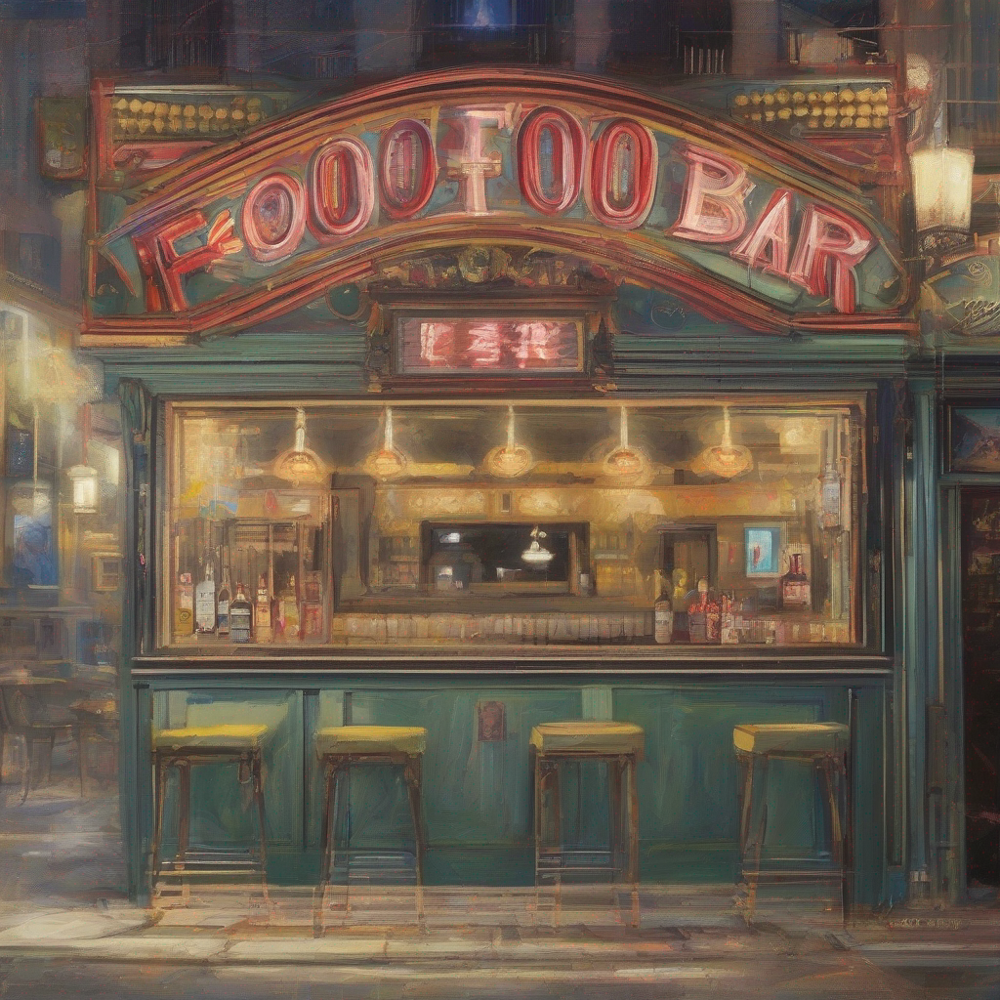

100%|██████████| 24/24 [00:11<00:00,  2.07it/s]


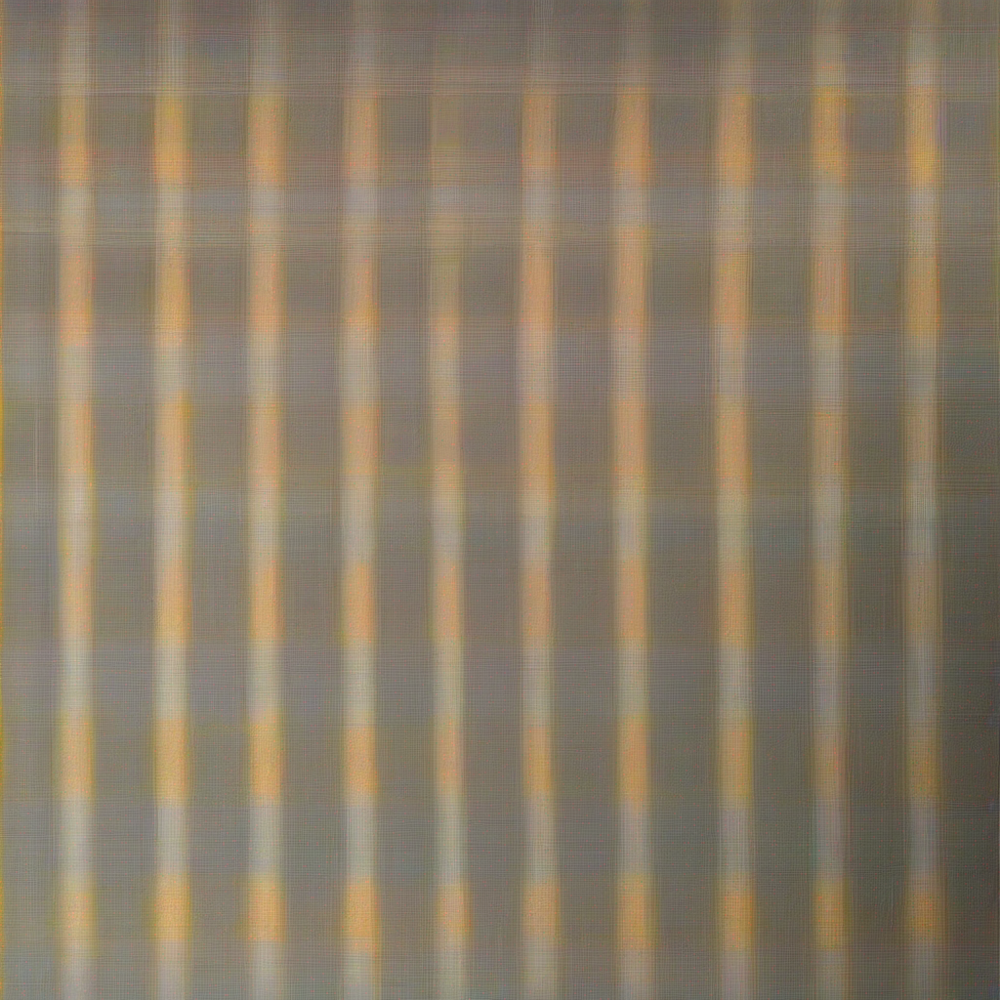

In [7]:
from diffusers import StableDiffusionXLPipeline
import torch

text2img = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
).to("cuda")

seed = 42
generator = torch.manual_seed(seed)

# text to image
text = "foo bar"
output = text2img(text, num_inference_steps=24, generator=generator)
img = output.images[0]
display(img)

# our trained lora
text2img.load_lora_weights("loras/foobar.safetensors")

generator = torch.manual_seed(seed)
lora_1 = text2img(text, num_inference_steps=24, generator=generator).images[0]
display(lora_1)

Apparently something is not working correctly, as the image has nothing to do with the training data of fruit images. At least the generated images look different with and without the LoRA, but we will have to investigate further.

### Testing Checkpoints
During training, the model was saved every 2 steps, which is very frequently. Due to this, we can try to generate images from the checkpoints to hopefully see the progression of the training and understand what went wrong.

100%|██████████| 24/24 [00:10<00:00,  2.31it/s]


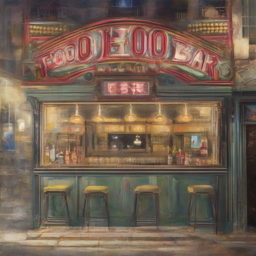

100%|██████████| 24/24 [00:10<00:00,  2.22it/s]


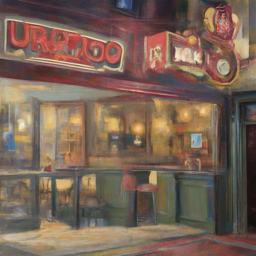

100%|██████████| 24/24 [00:11<00:00,  2.15it/s]


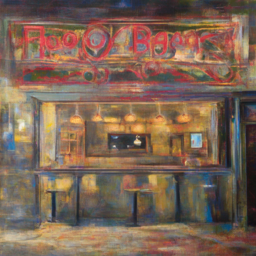

100%|██████████| 24/24 [00:11<00:00,  2.18it/s]


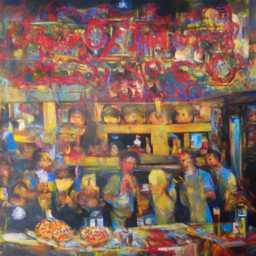

100%|██████████| 24/24 [00:11<00:00,  2.13it/s]


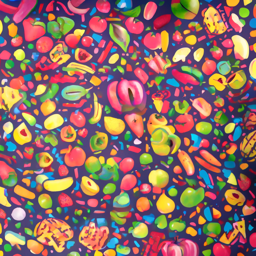

100%|██████████| 24/24 [00:11<00:00,  2.08it/s]


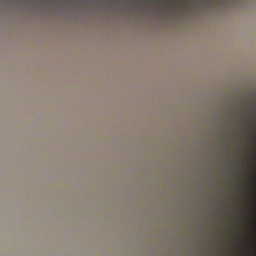

100%|██████████| 24/24 [00:11<00:00,  2.11it/s]


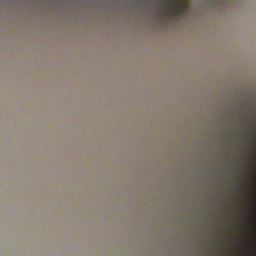

100%|██████████| 24/24 [00:10<00:00,  2.22it/s]


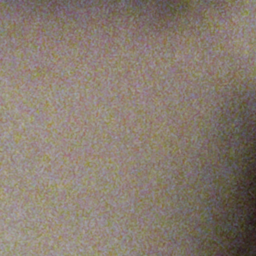

100%|██████████| 24/24 [00:11<00:00,  2.09it/s]


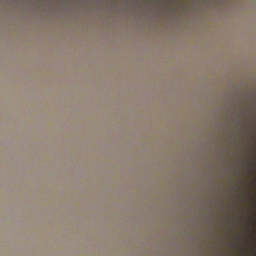

100%|██████████| 24/24 [00:11<00:00,  2.17it/s]


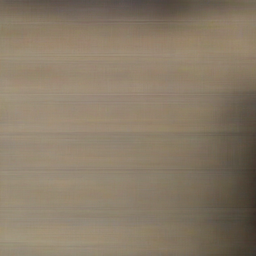

  0%|          | 0/24 [00:00<?, ?it/s]


KeyboardInterrupt: 

In [11]:
min_ckpt = 10
max_ckpt = 200
increment = 10

img_display_size = 256

for i in range(min_ckpt, max_ckpt + 1, increment):
    text2img.unload_lora_weights()

    # saved checkpoint
    lora_path = f"loras/checkpoint-{i}/pytorch_lora_weights.safetensors"
    text2img.load_lora_weights(lora_path)

    generator = torch.manual_seed(seed)
    img = text2img(text, num_inference_steps=24, generator=generator).images[0]
    img = img.resize((img_display_size, img_display_size))
    display(img)

Looking at the generated images, it seems that the LoRA did learn something after only a few steps, but then the generated images became worse. This could be due to the fact that the training data is very small and the model overfit to it or that the learning rate was too high. At the very least we can see that the LoRA was loaded correctly and that it did learn something, even if the hyperparameters were not optimal.
Another thing to consider was that the training data was not labeled properly, since we only wanted to test the LoRA and not the quality of the generated images. We would likely see better results if we used prompts that were related to the content of the specific images, instead of just using "foo bar" for all images.

## Training Pipeline
In this step we will create a pipeline to train a LoRA from a set of images. The pipeline will include the following steps:
1. Start with training parameters like path to the training data, number of epochs, batch size, learning rate, etc.
2. Preprocess the training data. (i.e. resize, crop, normalize, etc.)
3. Label the training data with prompts if necessary.
4. Start the training process.
5. Save the trained LoRA to disk.
6. Test the trained LoRA. (optional)

In [3]:



import sys
sys.path.append('diffusers/examples/text_to_image')

from train_text_to_image_lora_sdxl import main as _train_lora, parse_args as _parse_args

from dataclasses import dataclass, field
from typing import Any, Dict, List, Optional, Tuple, Union
import os
from create_metadata import create_metadata

@dataclass
class LoRATrainer:

    # training parameters
    pretrained_model_name_or_path: str = "stabilityai/stable-diffusion-xl-base-1.0"
    pretrained_vae_model_name_or_path: str = "madebyollin/sdxl-vae-fp16-fix"

    train_data_dir: str | None = None
    caption_column: str = "text"
    resolution: int = 1024
    train_batch_size: int = 1
    num_train_epochs: int = 1
    checkpointing_steps: int = 64
    learning_rate: float = 1e-04
    lr_scheduler: str = "constant"
    lr_warmup_steps: int = 0
    mixed_precision: str = "fp16"
    validation_epochs: int = 20
    seed: int = 42
    output_dir: str = "loras"
    validation_prompt: str | None = None
    rank: int = 4
    max_train_steps: int | None = None


    # LoRATrainer parameters
    # image types to look for in the input directory
    image_types: List[str] = field(default_factory=lambda: ["jpg", "jpeg", "png"])
    image_label: str | None = None
    # should the user be prompted for inputs
    prompt_user: bool = True


    def _get_input_dir(self, input_dir: str | None) -> str | None:
        '''Get input directory for training. If not provided, use the default train_data_dir.'''

        if input_dir is None:
            input_dir = self.train_data_dir

        if not input_dir or not os.path.exists(input_dir):
            raise ValueError(f"Input directory {input_dir} does not exist.")
        
        return input_dir
    

    def _get_output_dir(self, input_dir: str) -> str:
        '''Get output directory for training. If not provided, create a new directory based on the input directory.'''
        output_dir = self.output_dir
        if output_dir == "loras":
            input_name = os.path.basename(input_dir)
            exists = True
            i = 0
            i_str = ""
            while exists:
                output_dir = os.path.join("loras", f"{input_name}{i_str}")
                exists = os.path.exists(output_dir)
                if exists:
                    i += 1
                    i_str = f"_{i}"
                
        # create output directory
        os.makedirs(output_dir, exist_ok=True)

        return output_dir
    
    
    def _generate_metadata(self, input_dir: str, image_label: str | None) -> bool:
        '''Generate a metadata.csv file for the input directory.
        '''

        # check if image_label is provided
        if image_label is None:
            if self.image_label is not None:
                image_label = self.image_label
            elif self.prompt_user:
                image_label = input("Enter the prompt to train the model: ")
            else:
                print("Failed to generate metadata file. No labels provided.")
                return False
            

        # create metadata.csv file with image paths and labels
        create_metadata(input_dir, image_label)
        print(f"Metadata file created: {os.path.join(input_dir, 'metadata.csv')}")

        # wait to give user opportunity to check and edit the metadata file
        if self.prompt_user:
            input("Edit the metadata file if necessary and press Enter to continue.")

        return True

    
    def _check_metadata(self, input_dir: str, image_label: str | None) -> bool:
        '''Check metadata of input directory and ask user for label column if not provided.
        '''

        # check if a metadata.csv file exists in the input directory
        meta_file = os.path.join(input_dir, "metadata.csv")
        meta_exists = os.path.exists(meta_file)

        # if no metadata file exists, try to generate one
        if not meta_exists:
            generated = self._generate_metadata(input_dir, image_label)
            if not generated:
                print("Failed to locate or generate metadata file.")
                print("Please provide a valid metadata.csv file with file_name and text columns or provide a label.")
                return False


        return True
    

    def _generate_args(self, kv_args: Dict[str, Any]) -> List[str]:
        '''Generate a list of arguments for the training script.
        '''
        args = []
        for k, v in kv_args.items():
            if isinstance(v, bool):
                if v:
                    args.append(f"--{k}")
            elif isinstance(v, (list, tuple)):
                for i in v:
                    args.append(f"--{k}={i}")
            else:
                args.append(f"--{k}={v}")
        
        return args
    
    def _start_training(self, input_dir: str, output_dir: str):
        '''Start training the LoRA
        '''
        pass

    def train(self, input_dir: str | None = None, image_label: str | None = None):
        '''Collect training parameters and start training.
        '''

        # check if valid input directory is provided
        input_dir = self._get_input_dir(input_dir)

        # check metadata of input directory and ask user for label column
        # return if user cancels and wants to label the images manually
        cont = self._check_metadata(input_dir, image_label)
        if not cont:
            print("Training cancelled.")
            return
        
        # get output directory
        output_dir = self._get_output_dir(input_dir)

        # generate arguments for the training script
        kv_args = self.__dict__
        if "prompt_user" in kv_args:
            del kv_args["prompt_user"]
        if "image_types" in kv_args:
            del kv_args["image_types"]
        if "image_label" in kv_args:
            del kv_args["image_label"]

        kv_args['input_dir'] = input_dir
        kv_args['output_dir'] = output_dir

        args_list = self._generate_args(kv_args)

        print("Starting training...")
        print(" ".join(args_list))


trainer = LoRATrainer()
trainer.train("data/fruits/", "fruit")
        
        
    

Starting training...
--pretrained_model_name_or_path=stabilityai/stable-diffusion-xl-base-1.0 --pretrained_vae_model_name_or_path=madebyollin/sdxl-vae-fp16-fix --train_data_dir=None --caption_column=text --resolution=1024 --train_batch_size=1 --num_train_epochs=1 --checkpointing_steps=64 --learning_rate=0.0001 --lr_scheduler=constant --lr_warmup_steps=0 --mixed_precision=fp16 --validation_epochs=20 --seed=42 --output_dir=loras\_2 --validation_prompt=None --rank=4 --max_train_steps=None --input_dir=data/fruits/


## Img2Img Pipeline
In this step we will create a pipeline to generate an image from a text description and an input image using a trained LoRA. The pipeline will include the following steps:
1. Setup the network and load the trained LoRA from disk.
2. Preprocess the input image. (i.e. resize, crop, normalize, etc.)
3. Generate the image from the text description and the input image.
4. Return the generated image.